# Import Libraries and Packages


In [1]:
import numpy as np
import cv2
import glob
import joblib
from copy import copy
import matplotlib.pyplot as plt
#import sklearn
from skimage import exposure
from skimage.io import imread
from scipy.ndimage.measurements import label


# Get Spatial, Colour and Hog Features 

In [2]:
# Change color-space of image before getting feature vector
def change_color_space(image, colour_space):
    # YUV: color encoding system Y is "luma" or brightness, U and V are Blue minus luma and Red minus luma
    if colour_space == 'YUV':
        img = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    # YCrCb: used in digital systems similar to YUV, are used interchangeably with subtle difference in the way they are encoded
    elif colour_space == 'YCrCb':
        img = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else:
        img = image
    return img


# Get spatial features "raw pixels" through resizing image, convert each channel to column vector then stack the 3 channels
def get_spatial_features(image, size=(32, 32)):
    channel_1 = cv2.resize(image[:, :, 0], size).ravel()            # For size (32, 32), it produces (1024, ) vector
    channel_2 = cv2.resize(image[:, :, 1], size).ravel()
    channel_3 = cv2.resize(image[:, :, 2], size).ravel()
    features = np.hstack((channel_1, channel_2, channel_3))         # For size (32, 32), it produces (3072, ) vector
    return features


# Get color features using histogram of each channel and concatenating them
def get_colour_features(image, bins=32):                     # bins is the number of discrete values in the histogram
    channel_1 = np.histogram(image[:, :, 0], bins=bins)
    channel_2 = np.histogram(image[:, :, 1], bins=bins)
    channel_3 = np.histogram(image[:, :, 2], bins=bins)
    features = np.concatenate((channel_1[0], channel_2[0], channel_3[0]))
    return features


# Get HOG features and turn it to column vector
def get_hog_features(image):
    # windowSize, blockSize,blockStride,cellSize,nbins
    # windowSize: the size of window sliding over the image
    # blockSize: a block contain multiple cells, we normalize gradient over blocks (size is in pixels)
    # cellSize: a histogram is created for each cell then it is normalized over the block (size is in pixels)
    # blockStride: as cell size
    # nbins: the number of discrete orientations
    features = cv2.HOGDescriptor((64, 64), (16, 16), (8, 8), (8, 8), 9).compute(image)
    return features


# Get Prediction Features

In [3]:
def get_features(image, colour_space='YUV', size=(64, 64), type='All'):                # feature type is All or HOG
    if size != (64, 64):                                        # resize image to get features
        image = cv2.resize(image, (64, 64))
    image = change_color_space(image, colour_space)             # change colour_space of the image
    if type == 'All':
        image_features = []
        image_features.append(get_spatial_features(image))
        image_features.append(get_colour_features(image))
        image_features.append(get_hog_features(image))
        features = np.concatenate(image_features)
    else:
        features = get_hog_features(image)
    return features


# Generate Heatmap

In [4]:
buffer_weights = [0.1, 0.2, 0.3, 0.4]

def generate_heatmap(image, windows_list):
    heat = np.zeros_like(image[:, :, 0]).astype(np.float)  # use blank dark image
    # Add heat to each box in box list
    heat = add_heat(heat, windows_list)
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, 1)
    # Visualize the heatmap when displaying
    heatmap = np.clip(heat, 0, 255)

    return heatmap


def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1      # box[0][1]:y1     box[1][1]:y2

    # Return updated heatmap
    return heatmap  # Iterate through list of bboxes


def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0       # threshold is determined as 1 or 2
    # Return thresholded map
    return heatmap


# New--------------------------
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    out_img = np.copy(img)
    for b in bboxes:
        cv2.rectangle(out_img, *b, color, thick)  # drawing rectangle that is found in the pointer
    return out_img

# ------------------------------


def draw_bboxes(img, heatmap_buffer, heatmap_pre, N_buffer, prev_bboxes, new_frame, mask):
    if new_frame:
        heatmap_buffer.append(heatmap_pre)

        if len(heatmap_buffer) > N_buffer:  # remove the first component if it is more than N_buffer elements
            heatmap_buffer.pop(0)

        # weight the heatmap based on current frame and previous N frames
        idxs = range(N_buffer)
        for b, w, idx in zip(heatmap_buffer, buffer_weights, idxs):
            heatmap_buffer[idx] = b * w

        heatmap = np.sum(np.array(heatmap_buffer), axis=0)
        heatmap = apply_threshold(heatmap, threshold=sum(buffer_weights[0:N_buffer])*2)

        # Find final boxes from heatmap using label function
        labels = label(heatmap)

        bboxes = []
        # locate the bounding box
        for car_number in range(1, labels[1]+1):
            # Find pixels with each car_number label value
            nonzero = (labels[0] == car_number).nonzero()
            # Identify x and y values of those pixels
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
            # Define a bounding box based on min/max x and y
            bbox_tmp = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
            bboxes.append(bbox_tmp)

        # New ------------------------
        out = np.copy(img)

        # creating a mask having only the blue boxes with thickness =
        mask = draw_boxes(np.zeros_like(img), bboxes=bboxes, thick=-1)

        # returning contours of the bounded boxes by passing the B channel only
        contours, _ = cv2.findContours(mask[:, :, 2].astype('uint8'), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        for countour in contours:
            x, y, width, height = cv2.boundingRect(countour)
            cv2.rectangle(out, (x, y), (x + width, y + height), (0, 0, 255), 4)

        # ------------------------------

    else:
        out = img
        heatmap = 0
        bboxes = []
    # Return the image
    return out, heatmap, bboxes, mask


# Find Cars

In [19]:
mlp = joblib.load('models/MLP, YUV, ALL/mlp_model.pkl')  # loading the multilayer perceptron model
X_scaler = joblib.load('models/MLP, YUV, ALL/scaler.pkl')  # loading a transform for images normalization as in training

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                    xy_window=(64, 64), xy_overlap=(0.75, 0.75)):
    # setting default values for the part of the image to be rendered to be the whole image
    if x_start_stop[0] is None:
        x_start_stop[0] = 0
    if x_start_stop[1] is None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] is None:
        y_start_stop[0] = 0
    if y_start_stop[1] is None:
        y_start_stop[1] = img.shape[0]

    # determining the axes range
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]

    # determining the step of the window to be slided (in pixels)
    nx_pix_per_step = int(xy_window[0]*(1 - xy_overlap[0]))  # moving 0.25 of the window pixels to ensure overlap
    ny_pix_per_step = int(xy_window[1]*(1 - xy_overlap[1]))

    # calculating the number of windows to cover each axes with the step we decided
    nx_windows = int(xspan/nx_pix_per_step)
    ny_windows = int(yspan/ny_pix_per_step)

    # creating window list and passing on it vertically and horizontally
    # creating a window using the vertices of it in shape ((startx, starty), (endx , endy))
    # as if they are the 2 vertices on a diagonal from top to bottom from left to right
    window_list = []
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            startx = xs * nx_pix_per_step + x_start_stop[0]
            endx = (xs+1) * nx_pix_per_step + x_start_stop[0]
            starty = ys * ny_pix_per_step + y_start_stop[0]
            endy = (ys+1) * ny_pix_per_step + y_start_stop[0]
            window_list.append(((startx, starty), (endx, endy)))
    return window_list


def find_cars(image):

    # creating a list for the windows that have a vehicle detected
    on_windows = []

    # Parameters
    # parameters for passing different window sizes
    pxs = 384 #448 #320
    INCREMENT_SIZE_BY = 16
    PXS_LIMIT = 720
    y_start_stop = [400, 660]  # to search for cars in the lower part of the image #[400, 660]
    xy_overlap = (0.8, 0.8)  # overlap between the windows #(0.8, 0.8)

    ACCEPTANCE_THRESHOLD = .99  # to accept the probability of detected cars more than this probability

    while pxs < PXS_LIMIT:
        #700
        windows = slide_window(image, x_start_stop=[50, None], y_start_stop=y_start_stop, xy_window=(pxs, pxs), xy_overlap=xy_overlap)
        for window in windows:
            # resizing the window to fit like the rest of the training images
            resized = cv2.resize((image[window[0][1]: window[1][1], window[0][0]: window[1][0]]), (64, 64))
            features = get_features(resized).reshape(1, -1)  # reshaping it to get one sample/img unlike in the training

            # applying normalization on the extracted features
            x_scaled = X_scaler.transform(features)

            if resized.shape[0] > 0:
                # check if the model predicts there is car in the window greater than the ACCEPTANCE_THRESHOLD
                if mlp.predict_proba(x_scaled.reshape(1, -1))[0][1] > ACCEPTANCE_THRESHOLD:
                    on_windows.append(window)
        pxs += INCREMENT_SIZE_BY

    return on_windows


C:\Users\Owner\anaconda3\lib\site-packages\sklearn\base.py:338: UserWarning: Trying to unpickle estimator LabelBinarizer from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,
C:\Users\Owner\anaconda3\lib\site-packages\sklearn\base.py:338: UserWarning: Trying to unpickle estimator MLPClassifier from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  UserWarning,
C:\Users\Owner\anaconda3\lib\site-packages\sklearn\base.py:338: UserWarning: Trying to unpickle estimator StandardScaler from version 1.0.1 when using version 1.0.2. This might lead to breaking code or invalid results. Use at y

# Show Car Thumbnails

In [6]:
def draw_background_highlight(image):

    mask = cv2.rectangle(np.copy(image), (0, 0), (image.shape[1], 155), (0, 0, 0), thickness=cv2.FILLED)
    draw_img = cv2.addWeighted(src1=mask, alpha=0.3, src2=image, beta=0.8, gamma=0)

    return draw_img


def draw_thumbnails(img, window_list):

    cv2.putText(img, 'Detected Vehicles', (4, 37), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 0), 2, cv2.LINE_AA)
    for i, bbox in enumerate(window_list):
        thumbnail = img[bbox[0][1]:bbox[1][1], bbox[0][0]:bbox[1][0]]
        vehicle_thumb = cv2.resize(thumbnail, dsize=(100, 80))
        start_x = 300 + (i+1) * 30 + i * 100
        img[60:140, start_x:start_x + 100, :] = vehicle_thumb


# Debug mode 

In [7]:
def debug_mode(output_img, mask):
    # binary images should be converted to colored maybe using dstack

    # img_cdf, bin_centers = exposure.cumulative_distribution(heatmap_pre)
    # heatmap_pre = np.interp(heatmap_pre, bin_centers, img_cdf)
    # print(heatmap_pre.shape, heatmap_pre.dtype)

    scale_percent = 25

    # calculate the percent of original dimensions
    width = int(output_img.shape[1] * scale_percent / 100)
    height = int(output_img.shape[0] * scale_percent / 100)
    dsize = (width, height)

    # resizing the 2 images with the same size
    # heatmap_pre_output = cv2.resize(heatmap_pre, dsize)
    mask_output = cv2.resize(mask, dsize)

    # putting the images in foreground, background
    # foreground1, foreground2, background = heatmap_pre_output, mask_output, output_img.copy()
    foreground1, background = mask_output, output_img.copy()

    # blending the images
    alpha = 1
    blended_portion1 = cv2.addWeighted(foreground1, alpha,
                                       background[200:200 + height, 10:10 + width, :],
                                       1-alpha,
                                       0,
                                       background, dtype=cv2.CV_64F)
    background[200:200 + height, 10:10 + width, :] = blended_portion1
    # blended_portion2 = cv2.addWeighted(foreground2, alpha,
    #                                    background[220 + height:220 + 2*height, 10:10 + width, :],
    #                                    1 - alpha,
    #                                    0,
    #                                    background, dtype=cv2.CV_64F)
    # background[220 + height:220 + 2*height, 10:10 + width, :] = blended_portion2
    return background




# Plotting 

In [11]:
def plt_images(orig_image, orig_title, Debug_image, Debug_title, cmap='gray'):
    # Visualize images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25,10))
    ax1.set_title(orig_title, fontsize=30)
    ax1.imshow(orig_image)
    
    ax2.set_title(Debug_title, fontsize=30)
    ax2.imshow(Debug_image)
    
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Pipeline

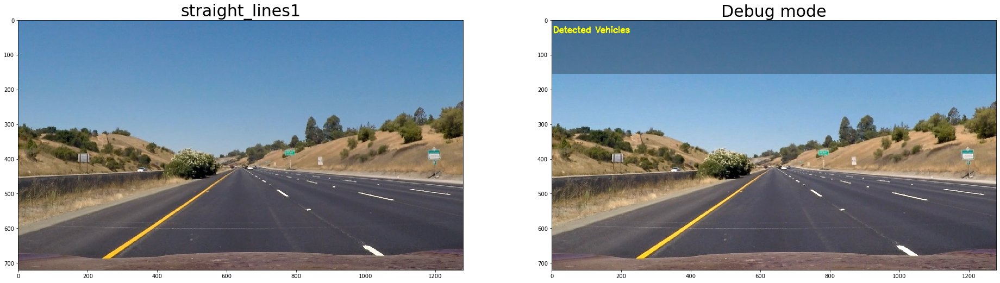

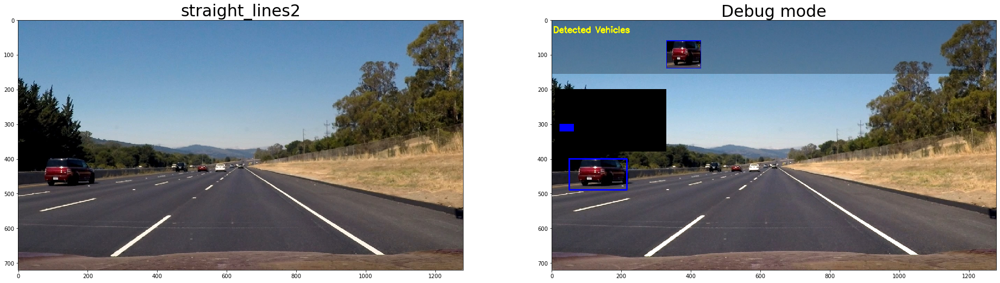

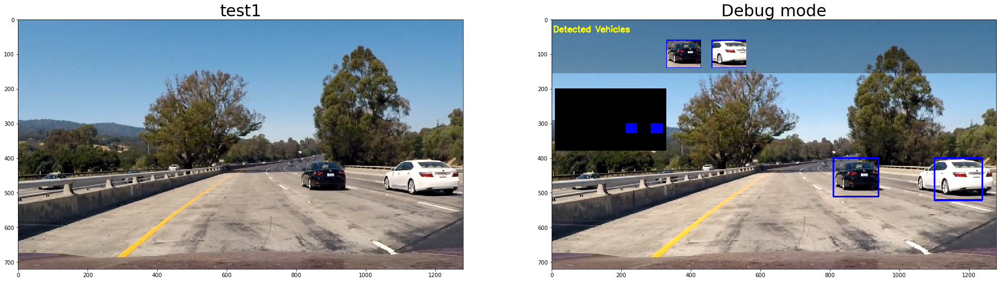

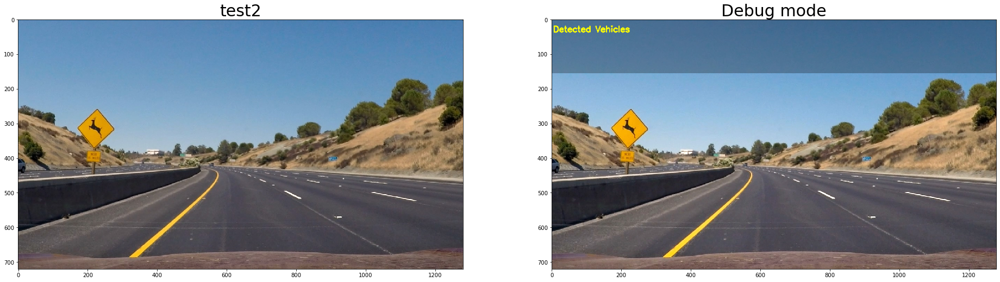

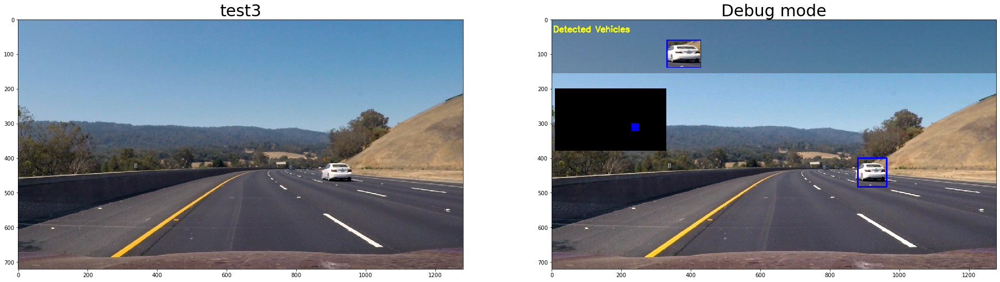

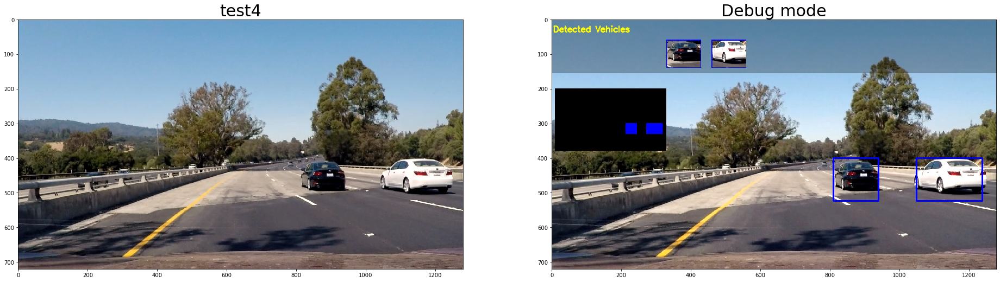

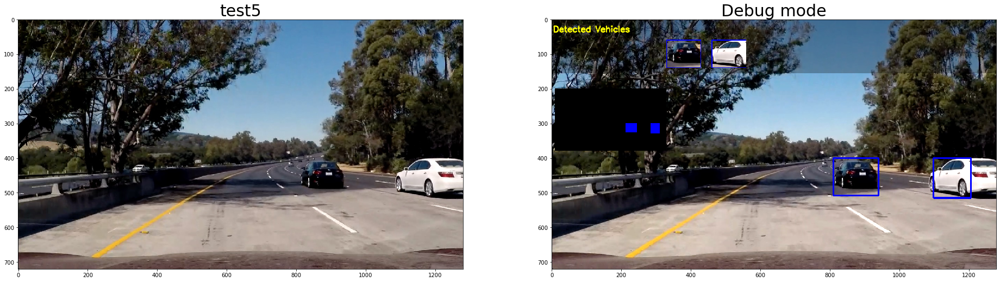

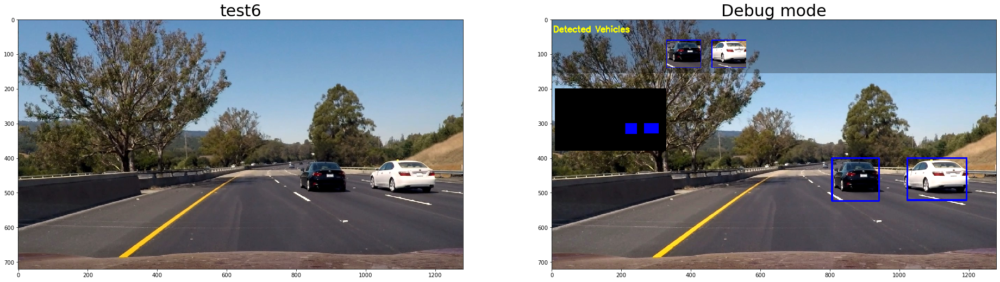

In [20]:
bboxes = []
i = 1

# Parameters for junshengfu_heatmap
Heatmap_buffer = []
N_buffer = 3
heatmap_pre = 0
mask = 0


def pipeline2(image, test_images, debug_mode_on):
    global bboxes
    global i
    global heatmap_pre
    global mask
    global clipped

    if i or test_images:  # test_images: to not drop frames in case of testing images

        windows_list = find_cars(np.copy(image))
        heatmap_pre = generate_heatmap(image, windows_list)
        output_image, heatmap_post, bboxes, mask = draw_bboxes(np.copy(image), copy(Heatmap_buffer), heatmap_pre,
                                                    min(len(Heatmap_buffer) + 1, N_buffer), bboxes, i or test_images, mask)
        i = 0
        if len(Heatmap_buffer) >= N_buffer:
            Heatmap_buffer.pop(0)

    else:

        for bbox in bboxes:
            # Draw the box on the image
            cv2.rectangle(image, bbox[0], bbox[1], (0, 0, 255), 4)
        output_image = image
        i = 1

    output_image = draw_background_highlight(output_image)
    draw_thumbnails(output_image, bboxes)
    if debug_mode_on and len(bboxes) > 0:
        # output_image = debug_mode(output_image,heatmap_pre, mask)
        output_image = debug_mode(output_image, mask)
    return output_image


for image in glob.glob('test_images/*.jpg'):
    #print (image)
    start=image.find('\\')
    end=image.find('.')
    #image = imread(image)
    image1 = cv2.imread(image)
    image1=cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    output_image = pipeline2(image1, 1, 1)
    plt_images(image1,image[start+1:end],output_image,'Debug mode')
    #plt.imshow(output_image)
    #plt.show()
